# **Automating visual inspection with ML in Agriculture**

## Abstract

In this lab, we will study how the quality of agricultural products can be classified based on photographs. Through the example of evaluating the quality of lemons, we will learn to form a DataSet from photographs and compare different types of classifiers. At the end, we will create a report that forms a DataSet of the lemons quality.


## Introduction

Today, various production lines and grocery supermarkets use video and photo images to evaluate product quality or find defects. To do this, special information systems are created that allow you to do it automatically. This lab will show you how to upload images, transform them and identify the key features that underlie the classification of goods or agricultural products.

Various classifiers will be analyzed and a function will be created that automatically regulates the product quality data set.


## Materials and methods

In this lab, we will learn the basic methods of images classification. The laboratory consists of four stages:
* Download and preliminary transformation of images
* Create image features
* Compare different classical classification methods
* Create function for lemon quality classification


## Prerequisites
* [Python](https://www.python.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - basic level
* [numpy](https://numpy.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - middle level
* [SeaBorn](https://seaborn.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - basic level
* [Matplotlib](https://matplotlib.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - basic level
* [mahotas](https://mahotas.readthedocs.io/en/latest/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - middle level
* [scikit-learn](https://scikit-learn.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - middle level
* [pandas](https://pandas.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) - basic level


## Objectives


After completing this lab, you will be able to:


* Download and transform images
* Create features of images
* Build different classification models
* Build a DataSet with quality level of agricultural products.


# Download and preliminary transformation of images


## Required libraries installation


We need to install additional libraries and upgrade the existing ones in the lab.


In [1]:
# conda install matplotlib >= 3.4

In [1]:
pip install conda config --add channels conda-forge


Usage:   
  /home/roni/my-jupyter-env/bin/python -m pip install [options] <requirement specifier> [package-index-options] ...
  /home/roni/my-jupyter-env/bin/python -m pip install [options] -r <requirements file> [package-index-options] ...
  /home/roni/my-jupyter-env/bin/python -m pip install [options] [-e] <vcs project url> ...
  /home/roni/my-jupyter-env/bin/python -m pip install [options] [-e] <local project path> ...
  /home/roni/my-jupyter-env/bin/python -m pip install [options] <archive url/path> ...

no such option: --add
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install mahotas

Note: you may need to restart the kernel to use updated packages.


In [4]:
#conda install scikit-learn

Note: you may need to restart the kernel to use updated packages.


## Required libraries import

In [3]:
import mahotas as mh
import seaborn as sns
from matplotlib import pyplot as plt 
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler 

#Classifiers
from sklearn.linear_model import LogisticRegression 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import ConfusionMatrixDisplay

## Data loading

For convenience, let's create a function that downloads all and displays first 50 pictures from a specified directory.
All training pictures should be placed in one directory.
Separate a csv file that consists of two columns: image file name and its class, must be located in the parent directory. The name of the directory with images must match the csv file name.

The function has to work in the following way:
1. Download a csv file into a DataSet.
2. Download all the images described in the csv file:
 [mahotas.imread()]  (https://mahotas.readthedocs.io/en/latest/io.html).
3. Display first 50 images.
4. Form and return a DataSet that has to be an array of tuples [image, class code].


In [4]:
pip install skillsnetwork

Note: you may need to restart the kernel to use updated packages.


In [7]:
import skillsnetwork

await skillsnetwork.prepare("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0UEREN/hiroshima-lemon.zip", overwrite=True)

  0%|          | 0/5515 [00:00<?, ?it/s]

Saved to '.'


In [5]:
def get_data(folder, file):
    plt.rcParams["axes.grid"] = False
    data = []
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv') # Form a DataSet from a csv
    print(ds)
    i = 0
    r = 0
    for im, c in ds.values:
        if i==0 and r < 50:
            fig = plt.figure(figsize = (20,20)) # Display an image
        image = mh.imread(folder + '/' + file + '/' + im) #Download an image
        data.append([image, c]) # Append finaly DataSet
        if r < 50:
            plt.subplot(1, 5, i+1) # Create a table of images
            plt.imshow(image)
        i += 1
        if i==5:         
            i = 0
        r += 1
    plt.show()
   
    return np.array(data)

hiroshima-lemon/train_images
                  id  class_num
0     train_0000.jpg          0
1     train_0001.jpg          0
2     train_0002.jpg          0
3     train_0003.jpg          0
4     train_0004.jpg          0
...              ...        ...
1097  train_1097.jpg          1
1098  train_1098.jpg          0
1099  train_1099.jpg          1
1100  train_1100.jpg          2
1101  train_1101.jpg          0

[1102 rows x 2 columns]


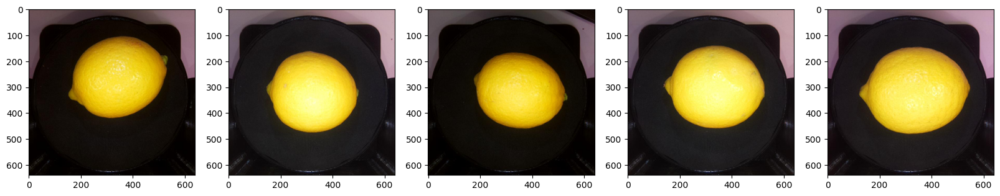

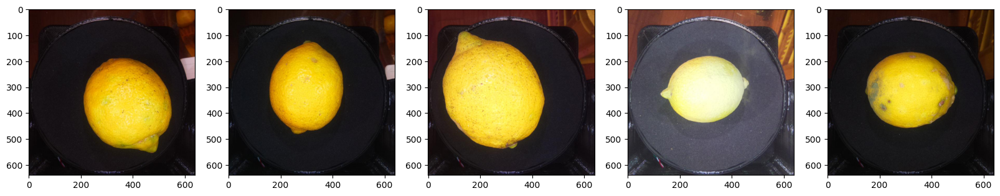

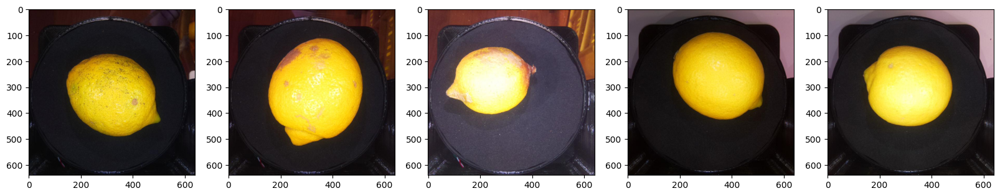

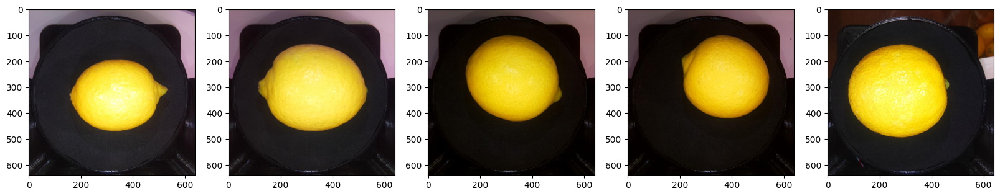

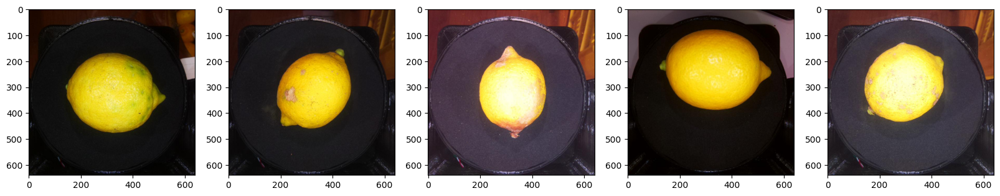

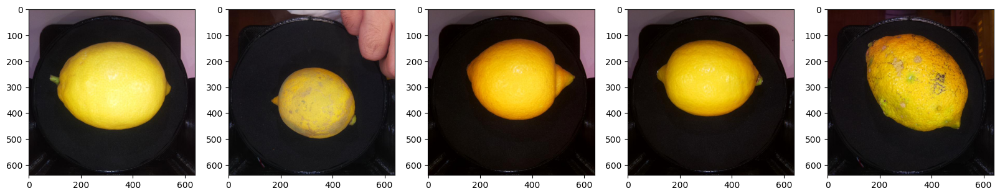

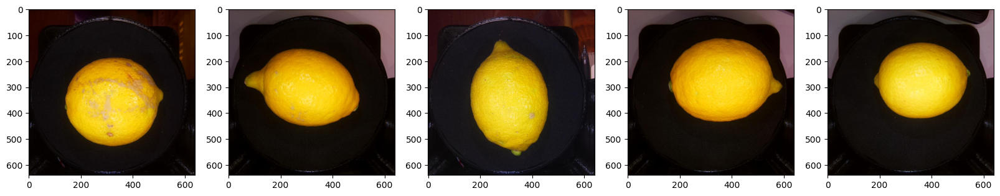

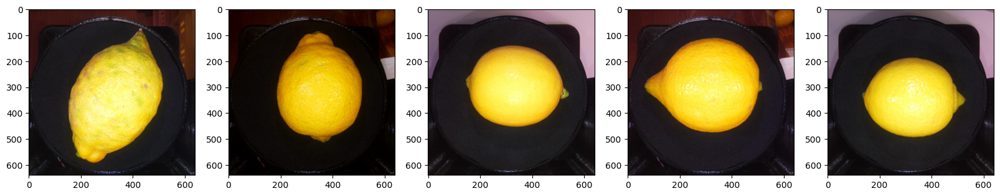

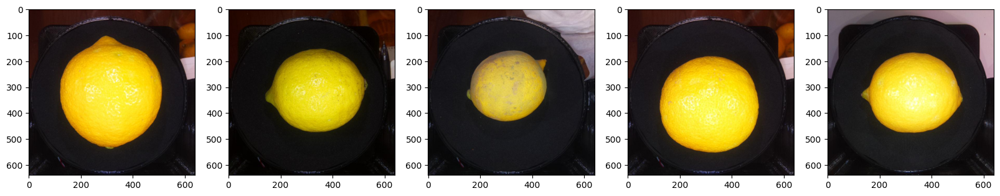

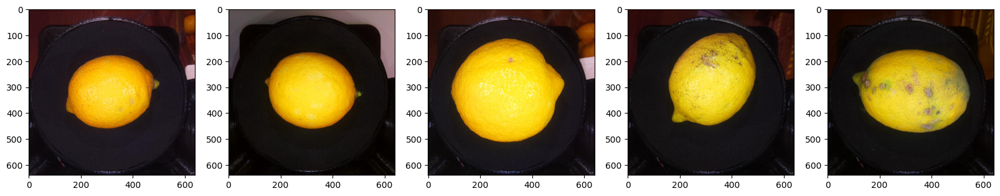

/tmp/ipykernel_3710/2647789241.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(data)


In [8]:
d = "hiroshima-lemon"
f = "train_images"
train = get_data(d, f)

<Axes: xlabel='Class', ylabel='count'>

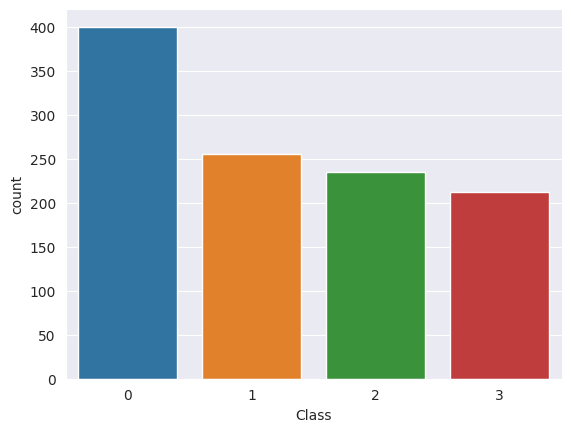

In [9]:
c = pd.DataFrame(train[:, 1]) #Create a DataFrame from the second column of the training data
c.columns = ['Class'] #Assign the column name "Class"
sns.set_style('darkgrid') # Set the plot style to "darkgrid"
sns.countplot(x="Class", data=c) # Create a count plot of the "Class" column

As you can see, the DataSet consist of 4 classes of lemon quality, denoted in the data set by codes from 0 to 3. For a better understanding and correct results visualization, let's create a dictionary describing each of these classes.


In [13]:
class_names = {
    0: 'excellent',
    1: 'good',
    2: 'processed products',
    3: 'disqualified'
}

For training and testing, all the pictures have to be divided into training and test ones and located in separate folders. Upload all the images to the appropriate arrays.


In [14]:
# sklearn function
from sklearn.model_selection import train_test_split # Import the train_test_split function from the scikit-learn library
im_train, im_val, c_train, c_val = train_test_split(train[:, 0], train[:, 1], test_size=0.3, shuffle=True) # Split the training data into training and validation sets
c_train = c_train.astype('int') # Convert the class labels to integers
c_val = c_val.astype('int') # Convert the class labels to integers

the train_test_split() function is used to split the training data into training and validation sets. The variables im_train and c_train contain the training images and labels, respectively. The variables im_val and c_val contain the validation images and labels, respectively.

The astype() function is used to convert the class labels (c_train and c_val) to integers. This is necessary because many machine learning algorithms expect the class labels to be integers.

In [15]:
print("Train shape", im_train.shape) # Size of the training DataSet
print("Test shape", im_val.shape) # Size of the test DataSet

Train shape (771,)
Test shape (331,)


As you can see, the training DataSet consists of 251 images and the test one consists of 66 images. All the images are in grey 2D (224x224) format.

<Axes: xlabel='Train Class Name', ylabel='count'>

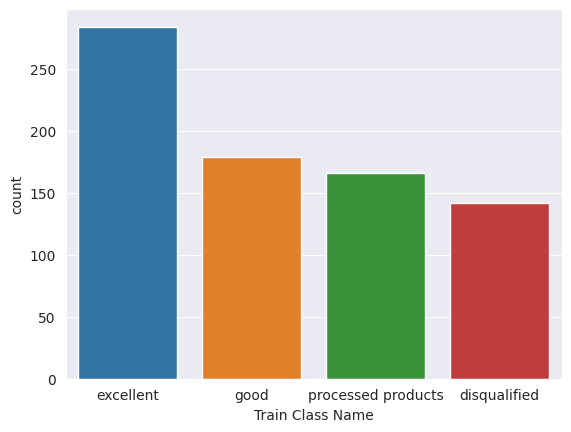

In [16]:
c = pd.DataFrame(c_train)
c.columns = ['Train Class']
c['Train Class Name'] = c['Train Class'].map(class_names)
sns.set_style('darkgrid')
sns.countplot(x="Train Class Name", data=c, order = ['excellent', 'good', 'processed products', 'disqualified'])

<Axes: xlabel='Validate Class Name', ylabel='count'>

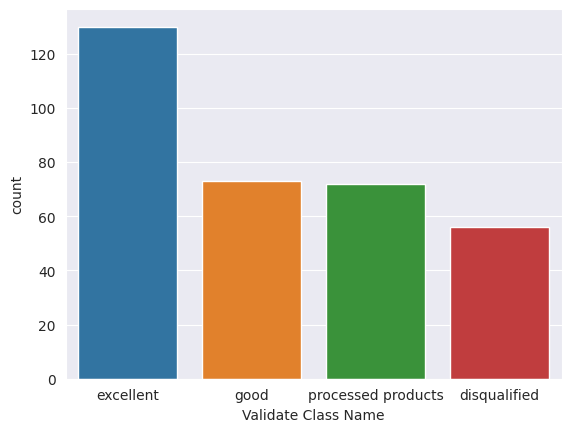

In [17]:
c = pd.DataFrame(c_val)
c.columns = ['Train Class']
c['Validate Class Name'] = c['Train Class'].map(class_names)
sns.set_style('darkgrid')
sns.countplot(x="Validate Class Name", data=c, order = ['excellent', 'good', 'processed products', 'disqualified'])

As you can see, the training and validation DataSets consist of a similar distribution of image classes.

## Data visualization

Quality of lemon
excellent


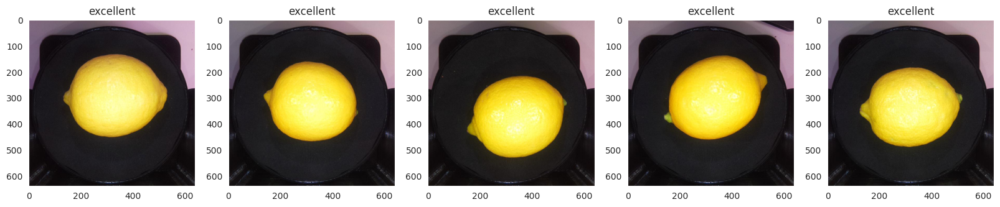

good


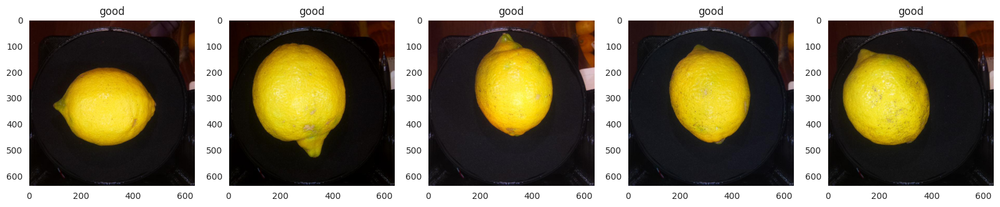

processed products


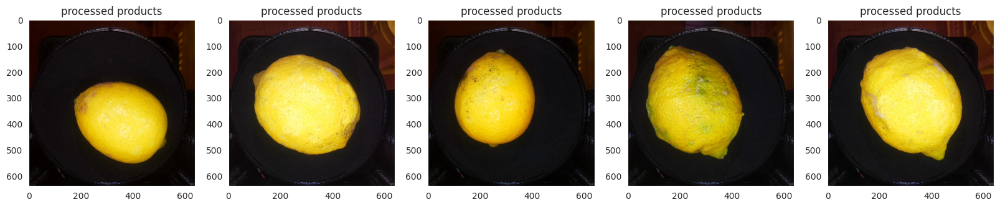

disqualified


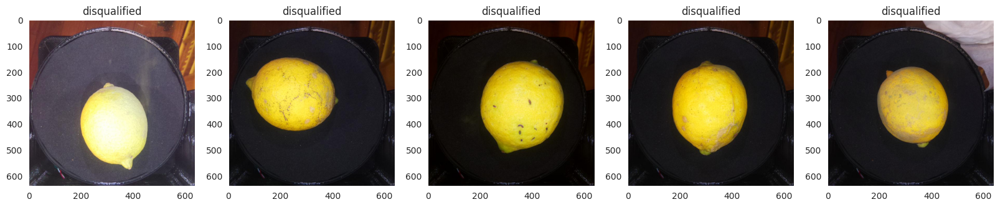

In [17]:
print("Quality of lemon") # Print the message "Quality of lemon"
plt.rcParams["axes.grid"] = False
for c in class_names: # Iterate over the class names in the "class_names" dictionary
    ims = np.where(c_train == c)[0][:5]     # Select the first five images from the training data that belong to that class
    print(class_names[c])
    fig = plt.figure(figsize = (20,20))     # Create a new figure window
    for i, im in enumerate(ims):     # Iterate over the images and plot them in a row
        plt.subplot(1, 5, i+1) #create a table of images
        plt.imshow(im_train[im])         # Plot the image in the current subplot
        plt.title(class_names[c])         # Set the title of the subplot to the class name
    plt.show()

## Image features creation

To classify objects, you need to transform the DataSet so that the input is a set of features, and the output is an object class. An image is a matrix of pixels. Each pixel is a color. Therefore it is impossible to submit a bare picture into a classical classifier's input. It is necessary to turn each picture into a set of certain features.

Mahotas makes it easy to calculate features from an image.
The corresponding functions are found in the [mahotas.features](https://mahotas.readthedocs.io/en/latest/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01) submodule. The Haralick set of texture features is well known. Like many image processing algorithms, it is named for its inventor. The features are based on textures, that is, they distinguish between structured and unstructured images, as well as various repetitive structures. With the help of mahotas, these features are calculated very easily:
haralick_features = mh.features.haralick (image)
haralick_features_mean = np.mean (haralick_features, axis = O)
haralick_features_all = np.ravel (haralick_features)
The mh.features.haralick function returns a 4 x 13 array with should be transformed into 1D by [NumPy.ravel()](https://numpy.org/doc/stable/reference/generated/numpy.ravel.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01). The first dimension is the four possible directions in which the features are calculated (vertical, horizontal, and two diagonals). If we are not interested in any particular direction, then we can average the features in all directions (in the code above, this variable is called haralick_features_mean). Alternatively, you can use all the characteristics individually (variable haralick_features_all). The choice depends on the properties of a particular dataset. We decided that the vertical and horizontal features should be stored separately in our case, so we use haralick_features_all.

We should make a function for the DataSet features creation.

In [18]:
def create_features(im):
    features = []
    for image in im:
        im_grey = mh.colors.rgb2grey(image, dtype = np.uint8)
        features.append(mh.features.haralick(im_grey).ravel())
    features = np.array(features)
    return (features)

The create_features() function can be used to extract Haralick texture features from a set of images. The feature values can then be used to train a machine learning model to classify images or to perform other tasks.

**This process can take a few minutes.**

In [19]:
features_train = create_features(im_train) # Create a NumPy array to contain the Haralick texture features for the training images
features_val = create_features(im_val) # Create a NumPy array to contain the Haralick texture features for the validation images

In [20]:
print(features_train.shape)
print(features_val.shape)

(771, 52)
(331, 52)


# Comparing different classical classification methods

If we want to compare some classifiers, we should use a Pipeline.
A Pipeline can be used to chain multiple estimators into one. This is useful as there is often a fixed sequence of steps in data processing, for example, feature selection, normalization and classification. A pipeline serves multiple purposes here:

You only have to call fit() once to evaluate a whole sequence of estimators.

You can grid search over parameters of all estimators in the pipeline at once.

Pipelines help to avoid leaking statistics from your test data into the trained model in cross-validation by ensuring that the same samples are used to train the transformers and predictors.
All estimators in a pipeline, except the last one, should be transformers (i.e. should have a transform method). The last estimator may be of any type (transformer, classifier, etc.).

The [sklearn.pipeline](https://scikit-learn.org/stable/modules/classes.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=pipeline#module-sklearn.pipeline) module implements utilities to build a composite estimator, as a chain of transforms and estimators.

The **[fit()](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=logisticregression#sklearn.linear_model.LogisticRegression.fit)** and **[score()](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=logisticregression#sklearn.linear_model.LogisticRegression.fit)** functions are used for training and evaluating the accuracy, this is an example of OOP polymorphism.

In order to test how it works we will use LogisticRegression.


We will use function **[plot_confusion_matrix()](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01)** for the analysis.

In [ ]:
pip install scikit-learn --upgrade

In [21]:
from sklearn.metrics import ConfusionMatrixDisplay

In [22]:
clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression(max_iter=1000))])
clf.fit(features_train, c_train)
scores_train = clf.score(features_train, c_train)
scores_val = clf.score(features_val, c_val)
print('Training DataSet accuracy: {: .1%}'.format(scores_train), 'Test DataSet accuracy: {: .1%}'.format(scores_val))
plot_confusion_matrix(clf, features_val, c_val)  
plt.show()

Training DataSet accuracy:  93.4% Test DataSet accuracy:  90.6%


NameError: name 'plot_confusion_matrix' is not defined

As you can see, the results are not bad.
Conflusion matrix shows us how many mistaken predictions we got.
It allows us to check other classifiers and compare the results.
We will test:
* [Logistic Regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=logistic+regression#sklearn.linear_model.LogisticRegression)
* [Nearest Neighbors](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=nearest+neighbors#sklearn.neighbors.NearestNeighbors)
* [Linear SVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVR.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=linear+svm#sklearn.svm.LinearSVR)
* [RBF SVM](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.kernels.RBF.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=rbf#sklearn.gaussian_process.kernels.RBF)
* [Gaussian Process](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.GaussianProcessClassifier.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=gaussianprocessclassifier#sklearn.gaussian_process.GaussianProcessClassifier)
* [Decision Tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=decisiontreeclassifier#sklearn.tree.DecisionTreeClassifier)
* [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=randomforestclassifier#sklearn.ensemble.RandomForestClassifier)
* [Multi-layer Perceptron classifier](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=mlpclassifier#sklearn.neural_network.MLPClassifier)
* [Ada Boost](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=adaboostclassifier#sklearn.ensemble.AdaBoostClassifier)
* [Naive Bayes](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=gaussiannb#sklearn.naive_bayes.GaussianNB)
* [Quadratic Discriminant Analysis](https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0UEREN465-2022-01-01&highlight=quadraticdiscriminantanalysis#sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis)


In [23]:
names = ["Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    LogisticRegression(max_iter=1000),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]
scores_train = []
scores_val = []
for name, clf in zip(names, classifiers):
    print("Fitting:", name)
    clf = Pipeline([('preproc', StandardScaler()), ('classifier', clf)])
    clf.fit(features_train, c_train)
    score_train = clf.score(features_train, c_train)
    score_val = clf.score(features_val, c_val)
    scores_train.append(score_train)
    scores_val.append(score_val)

Fitting: Logistic Regression
Fitting: Nearest Neighbors
Fitting: Linear SVM
Fitting: RBF SVM
Fitting: Gaussian Process


/home/roni/my-jupyter-env/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/roni/my-jupyter-env/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/roni/my-jupyter-env/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


Fitting: Decision Tree
Fitting: Random Forest
Fitting: Neural Net
Fitting: AdaBoost
Fitting: Naive Bayes
Fitting: QDA


/home/roni/my-jupyter-env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Let's print the results as a table.

In [24]:
res = pd.DataFrame(index = names)
res['scores_train'] = scores_train
res['scores_val'] = scores_val
res.columns = ['Test','Validate']
res.index.name = "Classifier accuracy"
pd.options.display.float_format = '{:,.2f}'.format
print(res)

                     Test  Validate
Classifier accuracy                
Logistic Regression  0.93      0.91
Nearest Neighbors    0.92      0.84
Linear SVM           0.77      0.77
RBF SVM              1.00      0.82
Gaussian Process     1.00      0.96
Decision Tree        0.83      0.79
Random Forest        0.81      0.77
Neural Net           0.96      0.94
AdaBoost             0.72      0.69
Naive Bayes          0.68      0.69
QDA                  1.00      0.97


You can see that the calculations are very fast and that Logistic Regression, Gaussian Process, QDA and Neural Network show the best result for the test DataSet.

Let's compare the results on a plot.


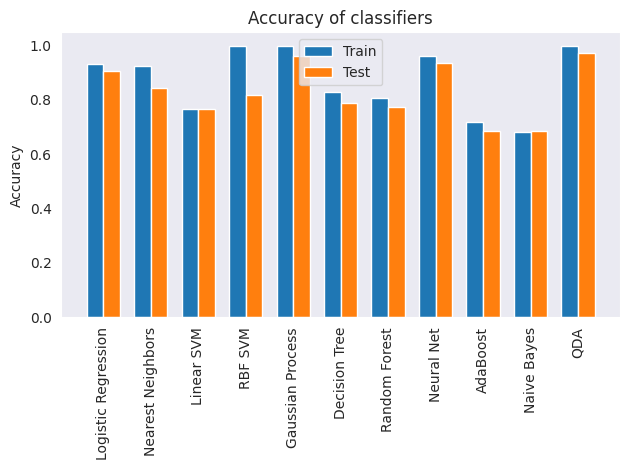

In [25]:
x = np.arange(len(names))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, scores_train, width, label='Train')
rects2 = ax.bar(x + width/2, scores_val, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of classifiers')
ax.set_xticks(x)
plt.xticks(rotation = 90)
ax.set_xticklabels(names)
ax.legend()

fig.tight_layout()

plt.show()

## Lemon quality classification report

Let's create a report. In order to classify a set of lemon images, we should do the following:
1. Download the images
2. Create a DataSet of features
3. Make a classification
4. Save the results in a file.


### Download the images

In [26]:
def get_test_data(folder, file):
    data = []
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')
    for im in ds.values:        
        image = mh.imread(folder + '/' + file + '/' + im[0])
        data.append(image)
    return np.array(data)

In [27]:
d = "hiroshima-lemon"
f = "test_images"
test = get_test_data(d, f)

hiroshima-lemon/test_images


### Create a DataSet of features

In [28]:
features_test = create_features(test)

In [29]:
print(test.shape)
print(features_test.shape)

(1651, 640, 640, 3)
(1651, 52)


### Make a classification

In [30]:
clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression(max_iter=1000))])
clf.fit(features_train, c_train)

Pipeline(steps=[('preproc', StandardScaler()),
                ('classifier', LogisticRegression(max_iter=1000))])

In [31]:
c_test = clf.predict(features_test)
c_test

array([0, 3, 0, ..., 3, 0, 0])

Classification results
excellent


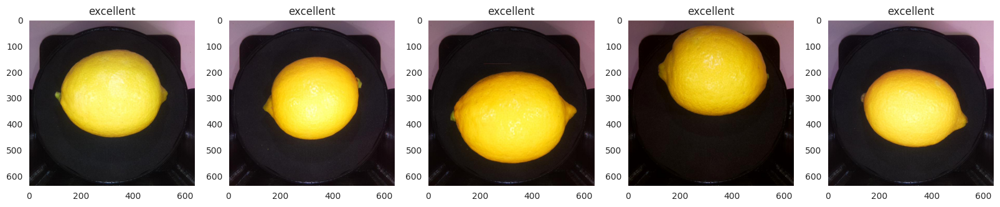

good


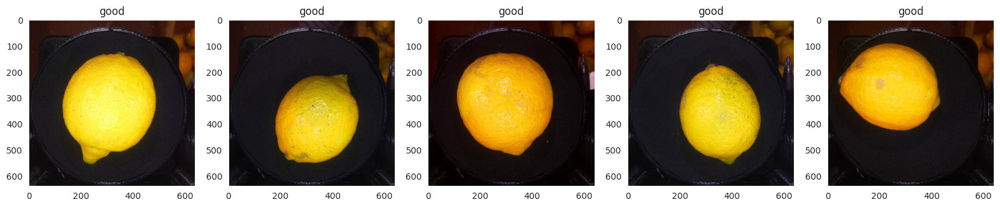

processed products


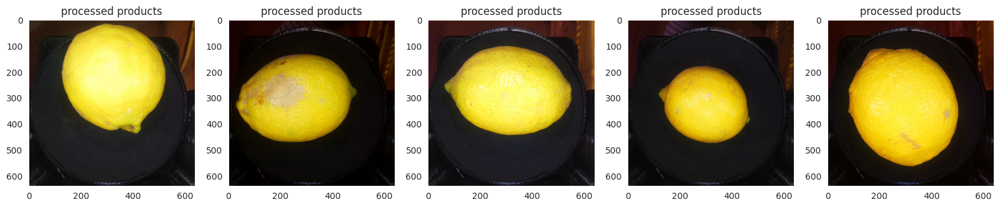

disqualified


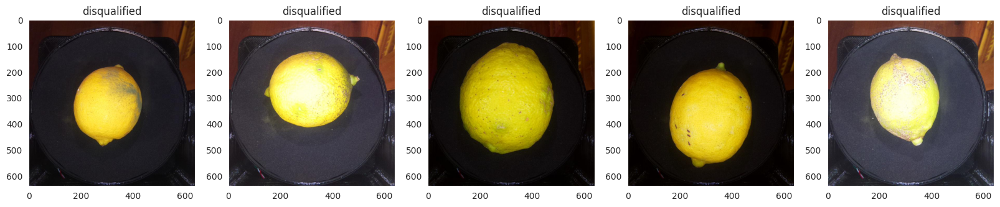

In [32]:
print("Classification results")
for c in class_names:
    ims = np.where(c_test == c)[0][:5]
    print(class_names[c])
    fig = plt.figure(figsize = (20,20)) 
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i+1) #create table of images
        plt.imshow(test[im])
        plt.title(class_names[c])
    plt.show()  

### Save the results in a file

In [33]:
def safe_test_result(folder, file, res):
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')
    ds['Class'] = res
    print(ds)
    ds.to_csv('results.csv', index=False)
    return

In [34]:
d = "hiroshima-lemon"
f = "test_images"
safe_test_result(d, f, c_test)

hiroshima-lemon/test_images
                 id  Class
0     test_0000.jpg      0
1     test_0001.jpg      3
2     test_0002.jpg      0
3     test_0003.jpg      3
4     test_0004.jpg      0
...             ...    ...
1646  test_1646.jpg      3
1647  test_1647.jpg      2
1648  test_1648.jpg      3
1649  test_1649.jpg      0
1650  test_1650.jpg      0

[1651 rows x 2 columns]
